### Damien Bukudjian

### Alex Lefevre

# Explication des modèles

Nous avons choisi d'utiliser deux modèles d'apprentissage profond : un réseau neuronal convolutif (CNN) et GoogLeNet

Nous voulions comparer les résultats d'un modèle basique et d'un modèle moderne et poussé spécialisé dans la classification d'image.

Détails du modèle GoogLeNet :

![image](https://media.discordapp.net/attachments/654342932303708160/1158772993095376987/Inception-layer-by-layer.PNG?ex=651d76f2&is=651c2572&hm=ecc2e5f6cb68232c1033903d5a75701a9077b42536aa525a43b7319db549d372&=&width=1276&height=670)

![image](https://media.discordapp.net/attachments/654342932303708160/1158772993548357692/Inceptionv1_architecture.png?ex=651d76f2&is=651c2572&hm=cb3d8583c92cf61209561d63d5b734b9f399e14a27e940759f790e00d7ea9464&=&width=1440&height=322)


L'architecture est profonde de 12 couches et a été créée pour être efficace, ce qui nous permet de l'utiliser malgré notre matériel. Elle contient aussi deux couches de classificateurs auxiliaires.

# Dataset et cas d'utilisation

Le dataset utilisé peut être téléchargé depuis le lien suivant : https://www.kaggle.com/datasets/yousefidris/ogedolympic-games-event-dateset/

Il contient 10 catégories de sports olympiques et 100 images dans chaque catégorie. Nous utilisons 980 images dans set d'entrainement dont 190 pour la validation et 20 images pour le set de test.

Nous chercherons donc à déterminer le sport correspondant aux images.

Les deux modèles choisis sont des modèles fréquemment utilisés pour la classification d'images.

In [1]:
# Import des librairies nécessaires
import numpy as np
import keras
import os
from keras.models import Model, Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dense
from keras.layers import Activation, Dropout
from keras.layers import Input, concatenate, AveragePooling2D, GlobalAveragePooling2D
from keras.metrics import categorical_crossentropy
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import load_img
import matplotlib.pyplot as plt
import math
%matplotlib inline

In [2]:
# Definition des variables paramètres du modèle
# Nous avons obtenu les meilleurs résultat avec un batch size de 32 et des images redimmensionné en 333,187 (1/3 de la taille original et 100 epochs

batch_size = 32
target_size = (333, 187)
nb_epochs = 100
dataset_folder_training = './olympics/olympics_training'
dataset_folder_testing = './olympics/olympics_testing'

In [3]:
# On crée l'objet ImageDataGenerator pour charger et preprocess les images du jeu de donnée.
# Rescale normalise les valeurs RGB entre 0 et 1.
# Shear_range est utilisé dans une perspective de data augmentation. Nous avons très peu de données, ce paramètre nous permet d'augmenter virtuellement les données en modifiant la perspective de chaque image
# Zoom_range zoom aléatoirement chaque image pour permettre au modèle de généraliser (data augmentation).
# Horizontal_flip: data augmentation
# Validation_split nous permet de diviser le jeu de données en jeu de validation et d'entrainement.

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True,
                                   validation_split=0.2)

#  Load the training Set and test set
training_set = train_datagen.flow_from_directory(dataset_folder_training,
                                                 target_size = target_size,
                                                 batch_size = batch_size,
                                                 class_mode = 'categorical',
                                                 subset='training')

validation_set = train_datagen.flow_from_directory(dataset_folder_training,
                                                 target_size = target_size,
                                                 batch_size = batch_size,
                                                 class_mode = 'categorical',
                                                 subset='validation')


num_classes = training_set.num_classes
class_names = list(training_set.class_indices.keys())
num_classes , class_names

Found 790 images belonging to 10 classes.
Found 190 images belonging to 10 classes.


(10,
 ['athletics',
  'badminton',
  'basketball',
  'football',
  'handball',
  'rugby',
  'swimming',
  'tennis',
  'waterpolo',
  'weightlifting'])

In [4]:
# Initialisation du CNN

model = Sequential()

model.add(Conv2D(32, (3, 3), input_shape = (target_size[0], target_size[1], 3), activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2, 2)))

model.add(Conv2D(32, (3, 3), activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2, 2)))

model.add(Conv2D(64, (3, 3), activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2, 2)))
model.add(Dropout(0.4))

model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.4))

model.add(Dense(num_classes))
model.add(Activation('softmax'))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 331, 185, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 165, 92, 32)       0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 163, 90, 32)       9248      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 81, 45, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 79, 43, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 39, 21, 64)        0

In [5]:
# Compilation du CNN
# Nous utilisons l'optimiseur Adam et l'indicateur de perte d'entropie croisée et la métrique Accuracy
# Pour le paramètre step_per_epoch et validation_steps, nous utilisons la formule courante : ceil(num_samples / batch_size)

model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])
history= model.fit(training_set,
                         steps_per_epoch = math.ceil(training_set.samples/batch_size),
                         epochs = nb_epochs,
                         validation_data = validation_set,
                         validation_steps = math.ceil(validation_set.samples/batch_size))
print(history.history.keys())

Epoch 1/100
25/25 [==============================] - 20s 763ms/step - loss: 2.3909 - accuracy: 0.1228 - val_loss: 2.1577 - val_accuracy: 0.2684
Epoch 2/100
25/25 [==============================] - 20s 803ms/step - loss: 2.1107 - accuracy: 0.1937 - val_loss: 1.8341 - val_accuracy: 0.3789
Epoch 3/100
25/25 [==============================] - 22s 864ms/step - loss: 1.9163 - accuracy: 0.2835 - val_loss: 1.6826 - val_accuracy: 0.4789
Epoch 4/100
25/25 [==============================] - 22s 865ms/step - loss: 1.8300 - accuracy: 0.3405 - val_loss: 1.5072 - val_accuracy: 0.4368
Epoch 5/100
25/25 [==============================] - 22s 870ms/step - loss: 1.6558 - accuracy: 0.3709 - val_loss: 1.4173 - val_accuracy: 0.5316
Epoch 6/100
25/25 [==============================] - 22s 861ms/step - loss: 1.6501 - accuracy: 0.3987 - val_loss: 1.3128 - val_accuracy: 0.5842
Epoch 7/100
25/25 [==============================] - 21s 857ms/step - loss: 1.5170 - accuracy: 0.4570 - val_loss: 1.2644 - val_accuracy:

In [6]:
filename="modelCNN"+str(batch_size)+"_"+str(target_size)+".keras"
print(filename)

modelCNN32_(333, 187).keras


In [7]:
model.save(filename)

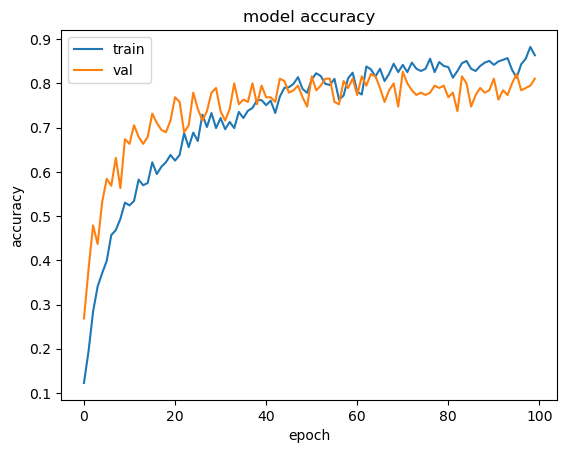

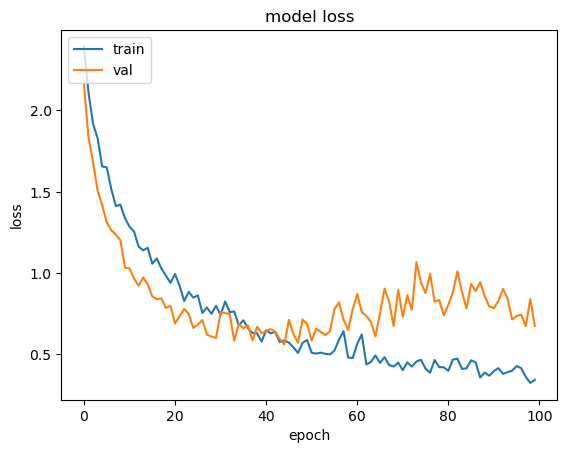

'\nresult = model.evaluate(validation_set, steps=1)\n\nprint(result)\n\nprint("Test-set classification accuracy: {0:.2%}".format(result[1]))\nresult = model.evaluate(training_set, steps=1)\nprint("Train-set classification accuracy: {0:.2%}".format(result[0]))\n'

In [8]:
# On affiche les graphiques pour accuracy et val_accuracy

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

"""
result = model.evaluate(validation_set, steps=1)

print(result)

print("Test-set classification accuracy: {0:.2%}".format(result[1]))
result = model.evaluate(training_set, steps=1)
print("Train-set classification accuracy: {0:.2%}".format(result[0]))
"""

In [9]:
model = keras.models.load_model(filename)

Found 20 images belonging to 10 classes.
1/1 [==============================] - 1s 578ms/step
20


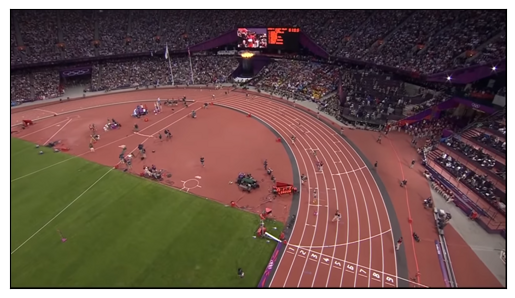

	athletics ==> 99.73 %
	badminton ==> 0.17 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.07 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.02 %


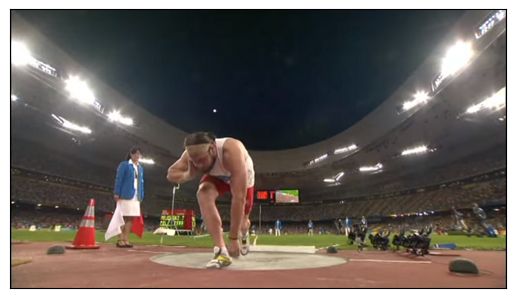

	athletics ==> 99.09 %
	badminton ==> 0.00 %
	basketball ==> 0.01 %
	football ==> 0.26 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 0.08 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.57 %


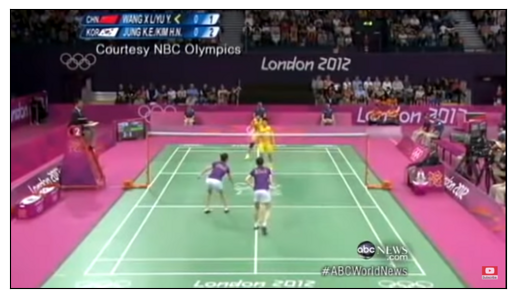

	athletics ==> 0.00 %
	badminton ==> 100.00 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.00 %


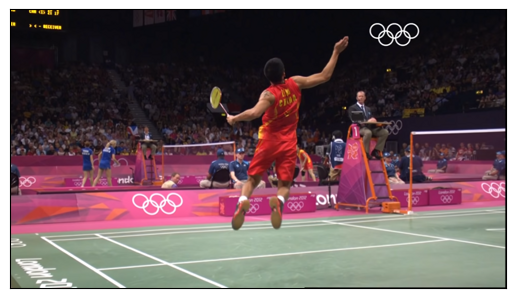

	athletics ==> 0.00 %
	badminton ==> 100.00 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.00 %


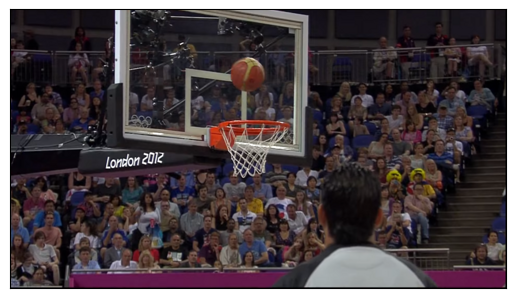

	athletics ==> 0.03 %
	badminton ==> 79.01 %
	basketball ==> 19.29 %
	football ==> 0.00 %
	handball ==> 0.69 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.35 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.64 %


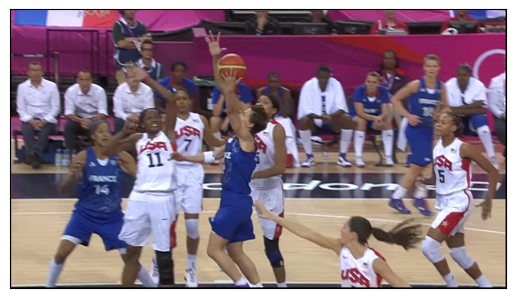

	athletics ==> 0.00 %
	badminton ==> 0.03 %
	basketball ==> 99.89 %
	football ==> 0.00 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.06 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.02 %


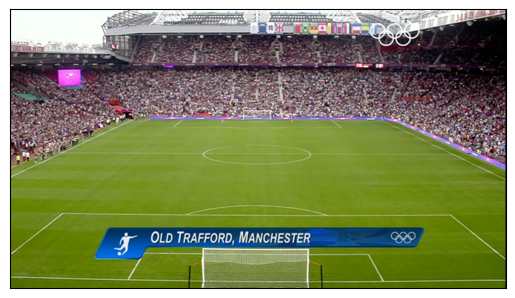

	athletics ==> 0.00 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 100.00 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.00 %


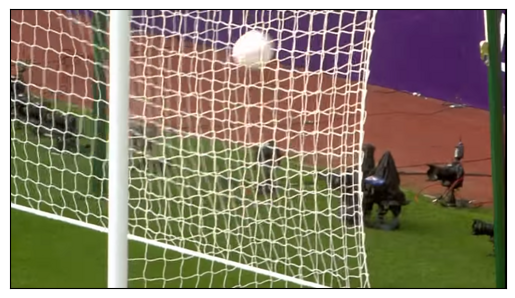

	athletics ==> 0.01 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 99.85 %
	handball ==> 0.00 %
	rugby ==> 0.04 %
	swimming ==> 0.00 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.11 %


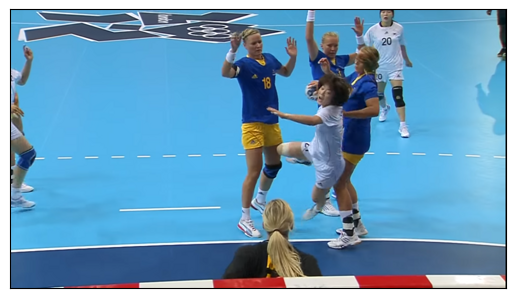

	athletics ==> 3.45 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 1.43 %
	rugby ==> 0.00 %
	swimming ==> 75.26 %
	tennis ==> 7.45 %
	waterpolo ==> 12.39 %
	weightlifting ==> 0.01 %


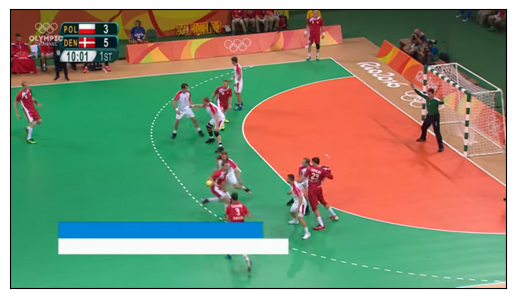

	athletics ==> 0.00 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 99.90 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.00 %
	waterpolo ==> 0.09 %
	weightlifting ==> 0.00 %


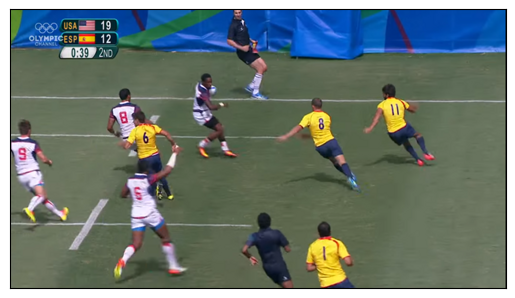

	athletics ==> 0.00 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 0.12 %
	handball ==> 0.00 %
	rugby ==> 99.37 %
	swimming ==> 0.00 %
	tennis ==> 0.49 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.01 %


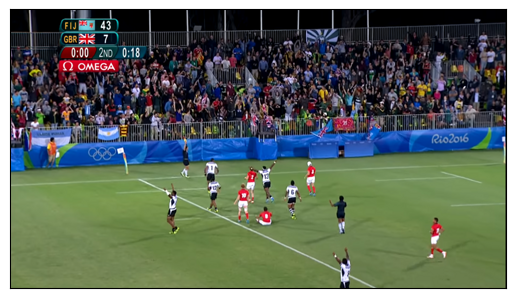

	athletics ==> 0.00 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 0.71 %
	handball ==> 0.00 %
	rugby ==> 99.28 %
	swimming ==> 0.00 %
	tennis ==> 0.01 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.01 %


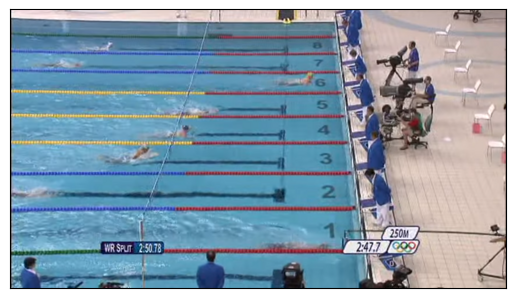

	athletics ==> 0.26 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.25 %
	rugby ==> 0.00 %
	swimming ==> 98.63 %
	tennis ==> 0.50 %
	waterpolo ==> 0.36 %
	weightlifting ==> 0.00 %


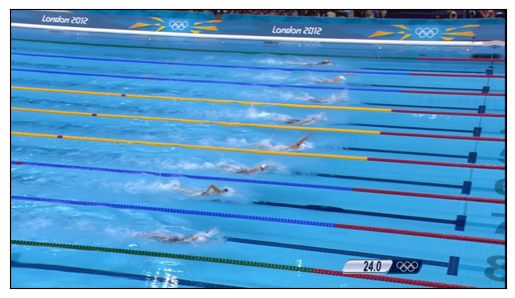

	athletics ==> 0.00 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.06 %
	rugby ==> 0.00 %
	swimming ==> 99.53 %
	tennis ==> 0.01 %
	waterpolo ==> 0.36 %
	weightlifting ==> 0.04 %


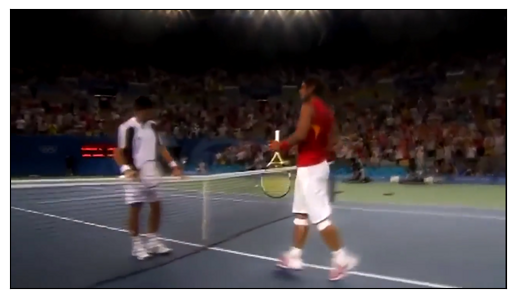

	athletics ==> 2.79 %
	badminton ==> 2.15 %
	basketball ==> 0.97 %
	football ==> 0.00 %
	handball ==> 0.39 %
	rugby ==> 0.14 %
	swimming ==> 0.36 %
	tennis ==> 51.41 %
	waterpolo ==> 0.01 %
	weightlifting ==> 41.78 %


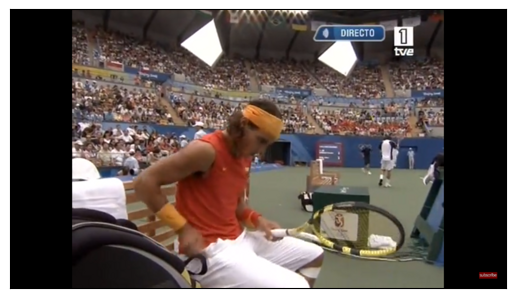

	athletics ==> 0.00 %
	badminton ==> 0.02 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.00 %
	rugby ==> 0.82 %
	swimming ==> 0.00 %
	tennis ==> 24.28 %
	waterpolo ==> 0.00 %
	weightlifting ==> 74.88 %


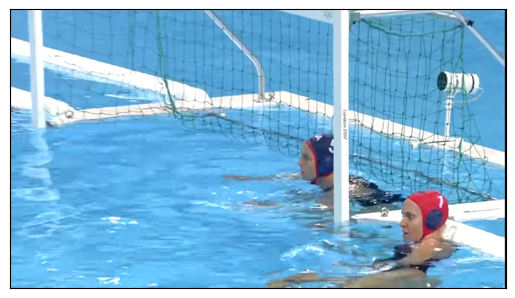

	athletics ==> 0.00 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.37 %
	rugby ==> 0.00 %
	swimming ==> 0.68 %
	tennis ==> 0.02 %
	waterpolo ==> 98.93 %
	weightlifting ==> 0.00 %


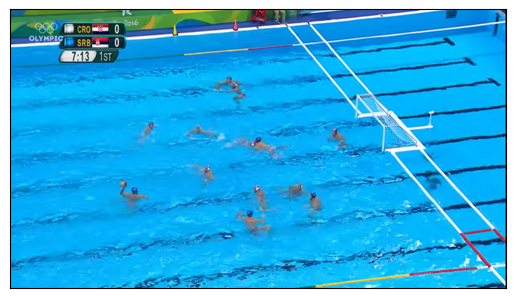

	athletics ==> 0.00 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.00 %
	waterpolo ==> 100.00 %
	weightlifting ==> 0.00 %


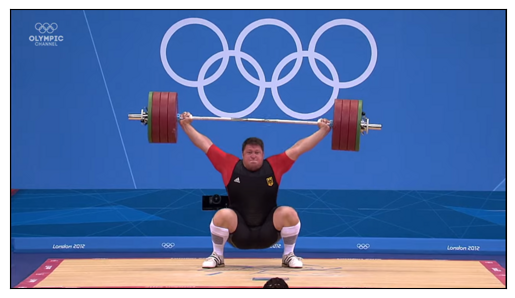

	athletics ==> 0.00 %
	badminton ==> 0.01 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 99.99 %


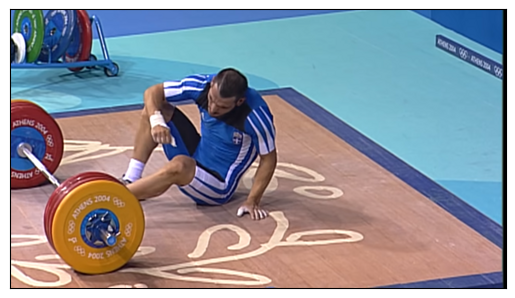

	athletics ==> 48.72 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 0.04 %
	handball ==> 0.01 %
	rugby ==> 0.00 %
	swimming ==> 5.32 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 45.92 %


In [10]:
# On preprocess les images de test pour effectuer une prédiction ensuite

test_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)
test_set = test_datagen.flow_from_directory(dataset_folder_testing,
                                                 target_size = target_size,
                                                 batch_size = batch_size,
                                                 class_mode = None,
                                                 shuffle=False)
result= model.predict(test_set)
print(len(result))

test_file_names=test_set.filenames

for i, p in enumerate(result):
    file=test_file_names[i]
    test_image = image.load_img(os.path.join(dataset_folder_testing,file))
    plt.imshow(test_image, interpolation = 'spline16')
    plt.xticks([]), plt.yticks([])
    plt.show()
    for index, pred in enumerate(p):
        print("\t%s ==> %.2f %%" % (class_names[index], round(pred*100,2)))

# Autre methode

In [11]:
def Inception_block(input_layer, f1, f2_conv1, f2_conv3, f3_conv1, f3_conv5, f4): 
  # Input: 
  # - f1: number of filters of the 1x1 convolutional layer in the first path
  # - f2_conv1, f2_conv3 are number of filters corresponding to the 1x1 and 3x3 convolutional layers in the second path
  # - f3_conv1, f3_conv5 are the number of filters corresponding to the 1x1 and 5x5  convolutional layer in the third path
  # - f4: number of filters of the 1x1 convolutional layer in the fourth path

  # 1st path:
  path1 = Conv2D(filters=f1, kernel_size = (1,1), padding = 'same', activation = 'relu')(input_layer)

  # 2nd path
  path2 = Conv2D(filters = f2_conv1, kernel_size = (1,1), padding = 'same', activation = 'relu')(input_layer)
  path2 = Conv2D(filters = f2_conv3, kernel_size = (3,3), padding = 'same', activation = 'relu')(path2)

  # 3rd path
  path3 = Conv2D(filters = f3_conv1, kernel_size = (1,1), padding = 'same', activation = 'relu')(input_layer)
  path3 = Conv2D(filters = f3_conv5, kernel_size = (5,5), padding = 'same', activation = 'relu')(path3)

  # 4th path
  path4 = MaxPooling2D((3,3), strides= (1,1), padding = 'same')(input_layer)
  path4 = Conv2D(filters = f4, kernel_size = (1,1), padding = 'same', activation = 'relu')(path4)

  output_layer = concatenate([path1, path2, path3, path4], axis = -1)

  return output_layer

In [12]:
def GoogLeNet():
  # input layer 
  input_layer = Input(shape = (target_size[0], target_size[1], 3))

  # convolutional layer: filters = 64, kernel_size = (7,7), strides = 2
  X = Conv2D(filters = 64, kernel_size = (7,7), strides = 2, padding = 'valid', activation = 'relu')(input_layer)

  # max-pooling layer: pool_size = (3,3), strides = 2
  X = MaxPooling2D(pool_size = (3,3), strides = 2)(X)

  # convolutional layer: filters = 64, strides = 1
  X = Conv2D(filters = 64, kernel_size = (1,1), strides = 1, padding = 'same', activation = 'relu')(X)

  # convolutional layer: filters = 192, kernel_size = (3,3)
  X = Conv2D(filters = 192, kernel_size = (3,3), padding = 'same', activation = 'relu')(X)

  # max-pooling layer: pool_size = (3,3), strides = 2
  X = MaxPooling2D(pool_size= (3,3), strides = 2)(X)

  # 1st Inception block
  X = Inception_block(X, f1 = 64, f2_conv1 = 96, f2_conv3 = 128, f3_conv1 = 16, f3_conv5 = 32, f4 = 32)

  # 2nd Inception block
  X = Inception_block(X, f1 = 128, f2_conv1 = 128, f2_conv3 = 192, f3_conv1 = 32, f3_conv5 = 96, f4 = 64)

  # max-pooling layer: pool_size = (3,3), strides = 2
  X = MaxPooling2D(pool_size= (3,3), strides = 2)(X)

  # 3rd Inception block
  X = Inception_block(X, f1 = 192, f2_conv1 = 96, f2_conv3 = 208, f3_conv1 = 16, f3_conv5 = 48, f4 = 64)

  # Extra network 1:
  X1 = AveragePooling2D(pool_size = (5,5), strides = 3)(X)
  X1 = Conv2D(filters = 128, kernel_size = (1,1), padding = 'same', activation = 'relu')(X1)
  X1 = Flatten()(X1)
  X1 = Dense(1024, activation = 'relu')(X1)
  X1 = Dropout(0.7)(X1)
  X1 = Dense(10, activation = 'softmax')(X1)

  
  # 4th Inception block
  X = Inception_block(X, f1 = 160, f2_conv1 = 112, f2_conv3 = 224, f3_conv1 = 24, f3_conv5 = 64, f4 = 64)

  # 5th Inception block
  X = Inception_block(X, f1 = 128, f2_conv1 = 128, f2_conv3 = 256, f3_conv1 = 24, f3_conv5 = 64, f4 = 64)

  # 6th Inception block
  X = Inception_block(X, f1 = 112, f2_conv1 = 144, f2_conv3 = 288, f3_conv1 = 32, f3_conv5 = 64, f4 = 64)

  # Extra network 2:
  X2 = AveragePooling2D(pool_size = (5,5), strides = 3)(X)
  X2 = Conv2D(filters = 128, kernel_size = (1,1), padding = 'same', activation = 'relu')(X2)
  X2 = Flatten()(X2)
  X2 = Dense(1024, activation = 'relu')(X2)
  X2 = Dropout(0.7)(X2)
  X2 = Dense(10, activation = 'softmax')(X2)
  
  
  # 7th Inception block
  X = Inception_block(X, f1 = 256, f2_conv1 = 160, f2_conv3 = 320, f3_conv1 = 32, 
                      f3_conv5 = 128, f4 = 128)

  # max-pooling layer: pool_size = (3,3), strides = 2
  X = MaxPooling2D(pool_size = (3,3), strides = 2)(X)

  # 8th Inception block
  X = Inception_block(X, f1 = 256, f2_conv1 = 160, f2_conv3 = 320, f3_conv1 = 32, f3_conv5 = 128, f4 = 128)

  # 9th Inception block
  X = Inception_block(X, f1 = 384, f2_conv1 = 192, f2_conv3 = 384, f3_conv1 = 48, f3_conv5 = 128, f4 = 128)

  # Global Average pooling layer 
  X = GlobalAveragePooling2D(name = 'GAPL')(X)

  # Dropoutlayer 
  X = Dropout(0.4)(X)

  # output layer 
  X = Dense(10, activation = 'softmax')(X)
  
  # model
  model = Model(input_layer, [X, X1, X2], name = 'GoogLeNet')

  return model

In [13]:
model = GoogLeNet()

In [14]:
model.summary()

Model: "GoogLeNet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 333, 187, 3)]        0         []                            
                                                                                                  
 conv2d_3 (Conv2D)           (None, 164, 91, 64)          9472      ['input_1[0][0]']             
                                                                                                  
 max_pooling2d_3 (MaxPoolin  (None, 81, 45, 64)           0         ['conv2d_3[0][0]']            
 g2D)                                                                                             
                                                                                                  
 conv2d_4 (Conv2D)           (None, 81, 45, 64)           4160      ['max_pooling2d_3[0][0

In [15]:
model.compile(loss='categorical_crossentropy', 
                  optimizer='adam', metrics=['accuracy'])

In [16]:
train_history = model.fit(
                training_set,
                steps_per_epoch=math.ceil(training_set.samples/batch_size),
                epochs=nb_epochs,
                validation_data = validation_set,
                validation_steps = math.ceil(validation_set.samples/batch_size),
                shuffle=True
                )

Epoch 1/100
25/25 [==============================] - 58s 2s/step - loss: 6.9176 - dense_6_loss: 2.3061 - dense_3_loss: 2.3059 - dense_5_loss: 2.3056 - dense_6_accuracy: 0.0734 - dense_3_accuracy: 0.0797 - dense_5_accuracy: 0.0823 - val_loss: 6.9069 - val_dense_6_loss: 2.3026 - val_dense_3_loss: 2.3017 - val_dense_5_loss: 2.3026 - val_dense_6_accuracy: 0.1000 - val_dense_3_accuracy: 0.1000 - val_dense_5_accuracy: 0.1000
Epoch 2/100
25/25 [==============================] - 48s 2s/step - loss: 6.7895 - dense_6_loss: 2.2656 - dense_3_loss: 2.2527 - dense_5_loss: 2.2713 - dense_6_accuracy: 0.1152 - dense_3_accuracy: 0.1152 - dense_5_accuracy: 0.1203 - val_loss: 7.6331 - val_dense_6_loss: 3.1951 - val_dense_3_loss: 2.0488 - val_dense_5_loss: 2.3892 - val_dense_6_accuracy: 0.1000 - val_dense_3_accuracy: 0.2000 - val_dense_5_accuracy: 0.1000
Epoch 3/100
25/25 [==============================] - 48s 2s/step - loss: 6.9907 - dense_6_loss: 2.3730 - dense_3_loss: 2.2925 - dense_5_loss: 2.3252 - den

In [17]:
filename="modelGooglenet"+str(batch_size)+"_"+str(target_size)+".keras"
print(filename)

modelGooglenet32_(333, 187).keras


In [18]:
model.save(filename)

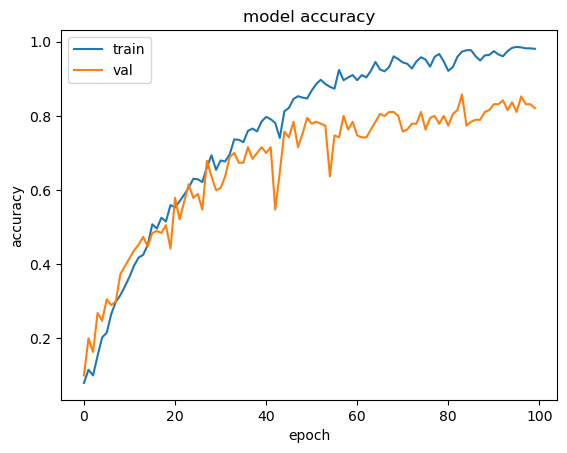

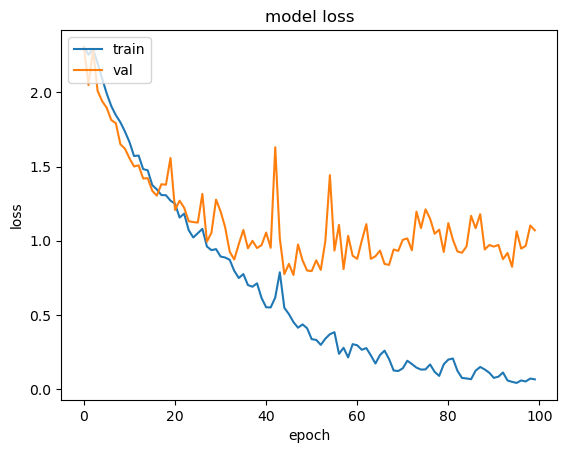

'\nresult = model.evaluate(validation_set, steps=1)\n\nprint(result)\n\nprint("Test-set classification accuracy: {0:.2%}".format(result[1]))\nresult = model.evaluate(training_set, steps=1)\nprint("Train-set classification accuracy: {0:.2%}".format(result[0]))\n'

In [20]:

#step5: Show the resulats
# summarize history for accuracy
plt.plot(train_history.history['dense_3_accuracy'])
plt.plot(train_history.history['val_dense_3_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(train_history.history['dense_3_loss'])
plt.plot(train_history.history['val_dense_3_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

"""
result = model.evaluate(validation_set, steps=1)

print(result)

print("Test-set classification accuracy: {0:.2%}".format(result[1]))
result = model.evaluate(training_set, steps=1)
print("Train-set classification accuracy: {0:.2%}".format(result[0]))
"""

In [21]:
model = keras.models.load_model(filename)

Found 20 images belonging to 10 classes.
1/1 [==============================] - 1s 760ms/step


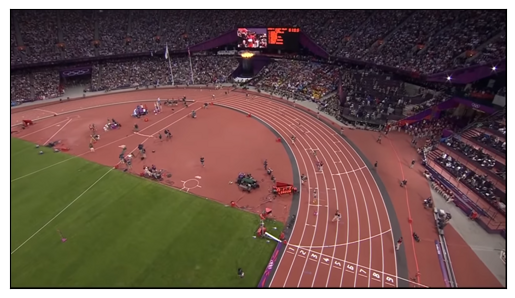

	athletics ==> 100.00 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.00 %


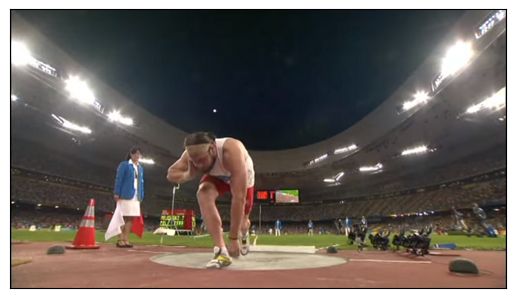

	athletics ==> 18.07 %
	badminton ==> 0.31 %
	basketball ==> 1.86 %
	football ==> 0.10 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.04 %
	waterpolo ==> 0.00 %
	weightlifting ==> 79.61 %


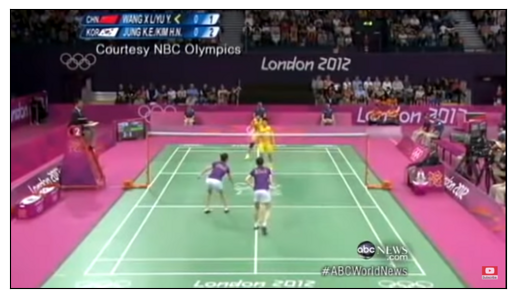

	athletics ==> 0.00 %
	badminton ==> 100.00 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.00 %


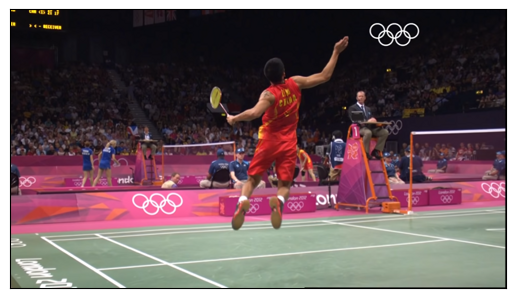

	athletics ==> 0.00 %
	badminton ==> 100.00 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.00 %


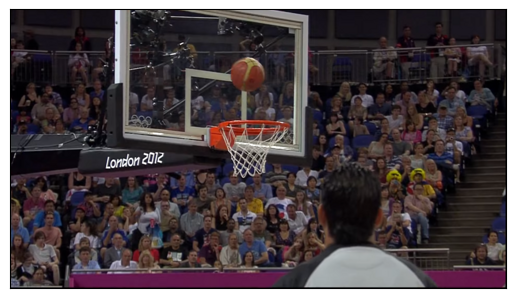

	athletics ==> 0.24 %
	badminton ==> 2.64 %
	basketball ==> 95.08 %
	football ==> 1.35 %
	handball ==> 0.01 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.03 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.65 %


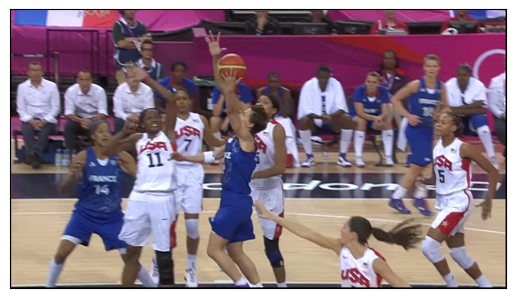

	athletics ==> 0.00 %
	badminton ==> 0.06 %
	basketball ==> 35.12 %
	football ==> 1.42 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 63.35 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.04 %


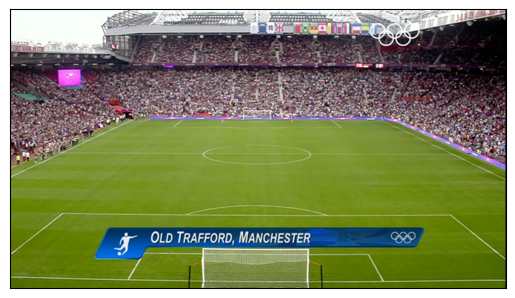

	athletics ==> 0.00 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 100.00 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.00 %


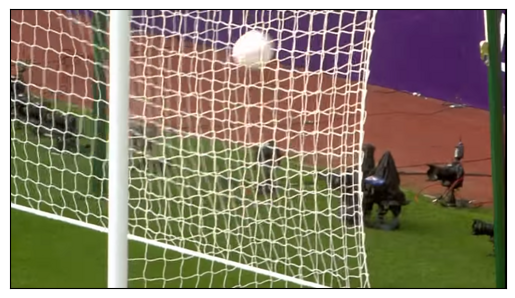

	athletics ==> 0.69 %
	badminton ==> 0.00 %
	basketball ==> 0.07 %
	football ==> 94.24 %
	handball ==> 0.00 %
	rugby ==> 0.03 %
	swimming ==> 0.00 %
	tennis ==> 0.38 %
	waterpolo ==> 0.00 %
	weightlifting ==> 4.59 %


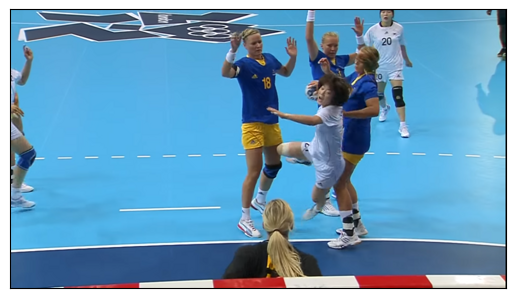

	athletics ==> 0.30 %
	badminton ==> 0.95 %
	basketball ==> 0.02 %
	football ==> 0.02 %
	handball ==> 3.85 %
	rugby ==> 0.03 %
	swimming ==> 30.15 %
	tennis ==> 0.10 %
	waterpolo ==> 38.30 %
	weightlifting ==> 26.27 %


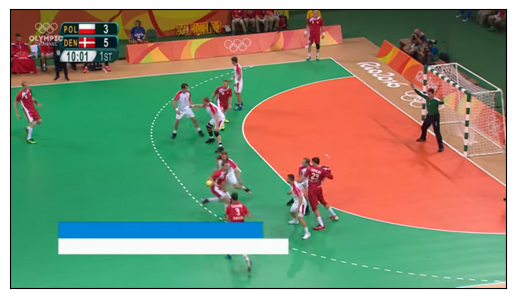

	athletics ==> 0.00 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 100.00 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.00 %


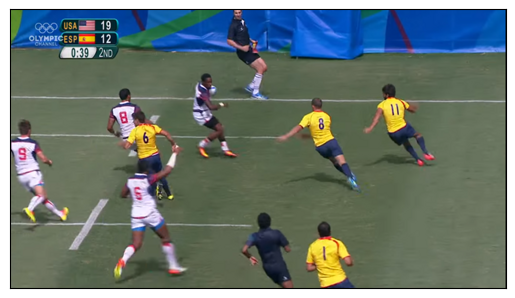

	athletics ==> 0.00 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.00 %
	rugby ==> 100.00 %
	swimming ==> 0.00 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.00 %


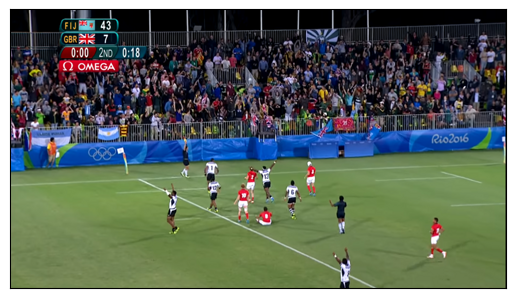

	athletics ==> 0.00 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 0.35 %
	handball ==> 0.00 %
	rugby ==> 99.65 %
	swimming ==> 0.00 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.00 %


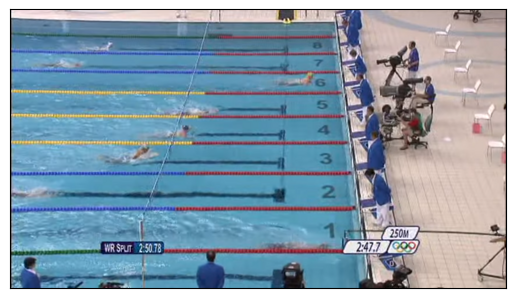

	athletics ==> 0.47 %
	badminton ==> 0.02 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.01 %
	rugby ==> 0.01 %
	swimming ==> 99.13 %
	tennis ==> 0.04 %
	waterpolo ==> 0.16 %
	weightlifting ==> 0.15 %


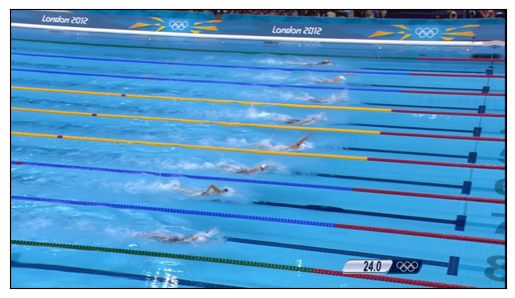

	athletics ==> 0.15 %
	badminton ==> 0.01 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.01 %
	rugby ==> 0.00 %
	swimming ==> 97.91 %
	tennis ==> 0.01 %
	waterpolo ==> 1.64 %
	weightlifting ==> 0.27 %


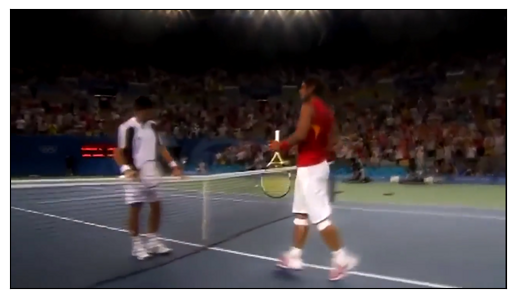

	athletics ==> 0.01 %
	badminton ==> 0.25 %
	basketball ==> 0.01 %
	football ==> 0.00 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 99.55 %
	waterpolo ==> 0.00 %
	weightlifting ==> 0.18 %


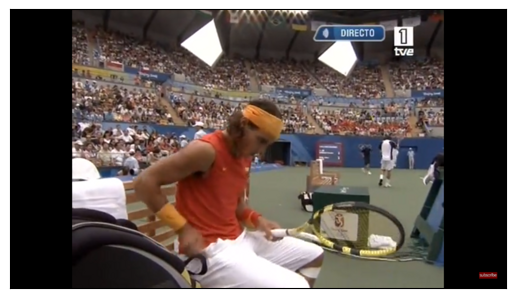

	athletics ==> 0.11 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.00 %
	rugby ==> 0.94 %
	swimming ==> 0.29 %
	tennis ==> 52.03 %
	waterpolo ==> 0.00 %
	weightlifting ==> 46.63 %


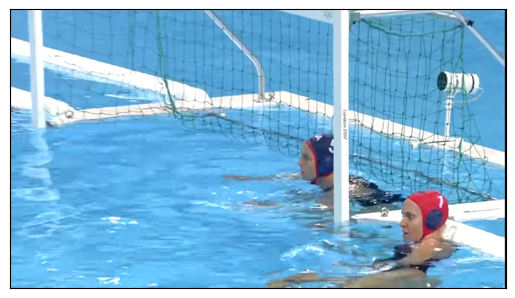

	athletics ==> 0.83 %
	badminton ==> 0.08 %
	basketball ==> 0.00 %
	football ==> 0.01 %
	handball ==> 0.31 %
	rugby ==> 0.02 %
	swimming ==> 54.91 %
	tennis ==> 0.03 %
	waterpolo ==> 43.19 %
	weightlifting ==> 0.63 %


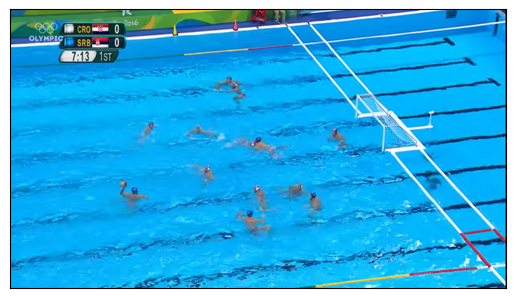

	athletics ==> 0.00 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 0.16 %
	tennis ==> 0.00 %
	waterpolo ==> 99.83 %
	weightlifting ==> 0.00 %


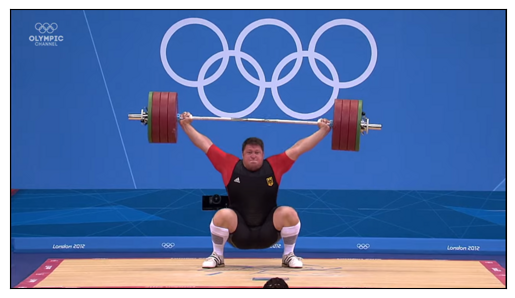

	athletics ==> 0.00 %
	badminton ==> 0.00 %
	basketball ==> 0.00 %
	football ==> 0.00 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 0.00 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 100.00 %


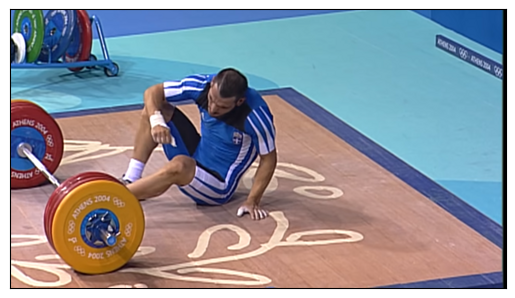

	athletics ==> 0.07 %
	badminton ==> 0.00 %
	basketball ==> 16.69 %
	football ==> 2.59 %
	handball ==> 0.00 %
	rugby ==> 0.00 %
	swimming ==> 71.69 %
	tennis ==> 0.00 %
	waterpolo ==> 0.00 %
	weightlifting ==> 8.96 %


In [22]:
np.set_printoptions(suppress=True)

test_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)
test_set = test_datagen.flow_from_directory(dataset_folder_testing,
                                                 target_size = target_size,
                                                 batch_size = batch_size,
                                                 class_mode = None,
                                                 shuffle=False)
result= model.predict(test_set)

test_file_names=test_set.filenames

avgResult = []
for b in range(len(result[0])):
    avgResult.append(np.mean([result[0][b],result[1][b],result[2][b]], axis=0))


for i, p in enumerate(avgResult):
    file=test_file_names[i]
    test_image = image.load_img(os.path.join(dataset_folder_testing,file))
    plt.imshow(test_image, interpolation = 'spline16')
    plt.xticks([]), plt.yticks([])
    plt.show()

    for index, pred in enumerate(p):
        print("\t%s ==> %.2f %%" % (class_names[index], round(pred*100,2)))

# Inteprétation des résultats

Les deux modèles montrent une précision satisfaisante (90% +) surtout avec la quantité d'images d'entrainement limitée.

On peut observer que le modèle GoogLeNet fournit des résultats légèrement supérieurs par rapport au CNN.
